In [2]:
!pip install pillow
!pip install opencv-python
!pip install piexif
!pip install matplotlib
!pip install seaborn

In [3]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

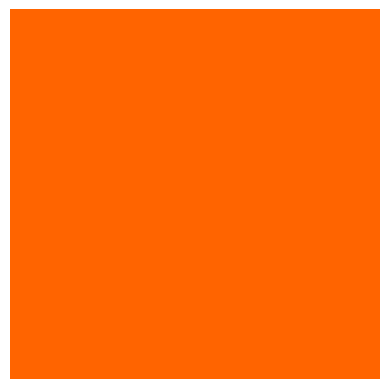

<class 'PIL.Image.Image'>
(100, 100)
RGB
('R', 'G', 'B')


In [4]:

# CREATING RGB IMAGE WITH PIL
img = Image.new("RGB", (100, 100), (255, 100, 0))

# Display the image in Colab using matplotlib
plt.imshow(img)
plt.axis('off')  # To hide the axes
plt.show()

# Printing image details
print(type(img))
print(img.size)
print(img.mode)
print(img.getbands())


<class 'PIL.Image.Image'>
(100, 100)
L
('L',)


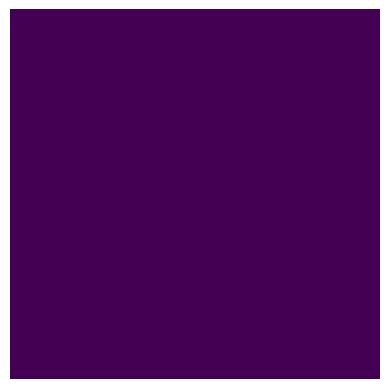

In [5]:
img1 = Image.new("L", (100,100),(255))

plt.imshow(img1)
plt.axis('off')  # To hide the axes

# Printing image details
print(type(img1))
print(img1.size)
print(img1.mode)
print(img1.getbands())


(100, 100, 3)


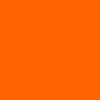

<module 'cv2' from '/usr/local/lib/python3.10/dist-packages/cv2/__init__.py'>

In [6]:
#Lets create using numpy
img_cv = np.zeros((100,100,3), np.uint8)   # For grayscale image - np.zeros((100,100),np.uint8)

#Fill the image with orange value
img_cv[:] = (0, 100, 255)     # By default the format is "BGR"

#For grayscale image
#img_cv[:] = (200)


print(img_cv.shape)

cv2_imshow(img_cv)
cv2.waitKey(0)
cv2.destroyAllWindows()

cv2

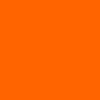

File size: 0.81 KB


In [7]:
#RGBA
# Opencv dose not directly support adding an alpha channel to an image you can acheive this by creatng a new image with 4
# channels(BGRA) and copying the original image data int it.

bgra_opencv = np.zeros((img_cv.shape[0], img_cv.shape[1],4),np.uint8)

#Copy the original image data into BGR channels
bgra_opencv[:,:,:3] = img_cv

bgra_opencv[:,:,3] = 255

cv2_imshow(bgra_opencv)
cv2.waitKey(0)
cv2.destroyAllWindows()

def print_file_size(file_path):
    file_size = os.path.getsize(file_path)
    print(f"File size: {file_size / 1024:.2f} KB")


#Save Image
cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/bgra_opencv.jpg", bgra_opencv,[cv2.IMWRITE_JPEG_QUALITY,95])
print_file_size("/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/bgra_opencv.jpg")


In [8]:
bgra_opencv

array([[[  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        ...,
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255]],

       [[  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        ...,
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255]],

       [[  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        ...,
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255]],

       ...,

       [[  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        ...,
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255]],

       [[  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        ...,
        [  0, 100, 255, 255],
        [  0, 100, 255, 255],
        [  0, 100, 255, 255]],

       [[  0

##EXIF Details

In [9]:
from PIL import Image, ExifTags

In [10]:
img2 = Image.open("/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg")
exif_date = img2.getexif()

for tag, value in exif_date.items():
  tag_name = ExifTags.TAGS.get(tag,tag)
  print(f"{tag_name}: {value}")

TileWidth: 512
TileLength: 512
ResolutionUnit: 2
ExifOffset: 248
Make: Apple
Model: iPhone 15 Pro
Software: 17.5.1
Orientation: 6
DateTime: 2024:07:01 20:30:40
YCbCrPositioning: 1
XResolution: 72.0
YResolution: 72.0
HostComputer: iPhone 15 Pro


In [11]:
#Now we will use another library.

import piexif

exif_dict = piexif.load(img2.info.get("exif",b""))
print(exif_dict)

{'0th': {271: b'Apple', 272: b'iPhone 15 Pro', 274: 6, 282: (72, 1), 283: (72, 1), 296: 2, 305: b'17.5.1', 306: b'2024:07:01 20:30:40', 316: b'iPhone 15 Pro', 322: 512, 323: 512, 531: 1, 34665: 248}, 'Exif': {33434: (1, 120), 33437: (11, 5), 34850: 2, 34855: 250, 36864: b'0232', 36867: b'2024:07:01 20:30:40', 36868: b'2024:07:01 20:30:40', 36880: b'-04:00', 36881: b'-04:00', 36882: b'-04:00', 37121: b'\x01\x02\x03\x00', 37377: (62128, 8995), 37378: (40006, 17585), 37379: (41354, 11415), 37380: (0, 1), 37383: 3, 37385: 16, 37386: (1551800, 699009), 37396: (1905, 1515, 751, 756), 37500: b'Apple iOS\x00\x00\x01MM\x00/\x00\x01\x00\t\x00\x00\x00\x01\x00\x00\x00\x0e\x00\x02\x00\x07\x00\x00\x02\x00\x00\x00\x02H\x00\x03\x00\x07\x00\x00\x00h\x00\x00\x04H\x00\x04\x00\t\x00\x00\x00\x01\x00\x00\x00\x01\x00\x05\x00\t\x00\x00\x00\x01\x00\x00\x00\xc4\x00\x06\x00\t\x00\x00\x00\x01\x00\x00\x00\xdd\x00\x07\x00\t\x00\x00\x00\x01\x00\x00\x00\x01\x00\x08\x00\n\x00\x00\x00\x03\x00\x00\x04\xb0\x00\x0e\x00\t\

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


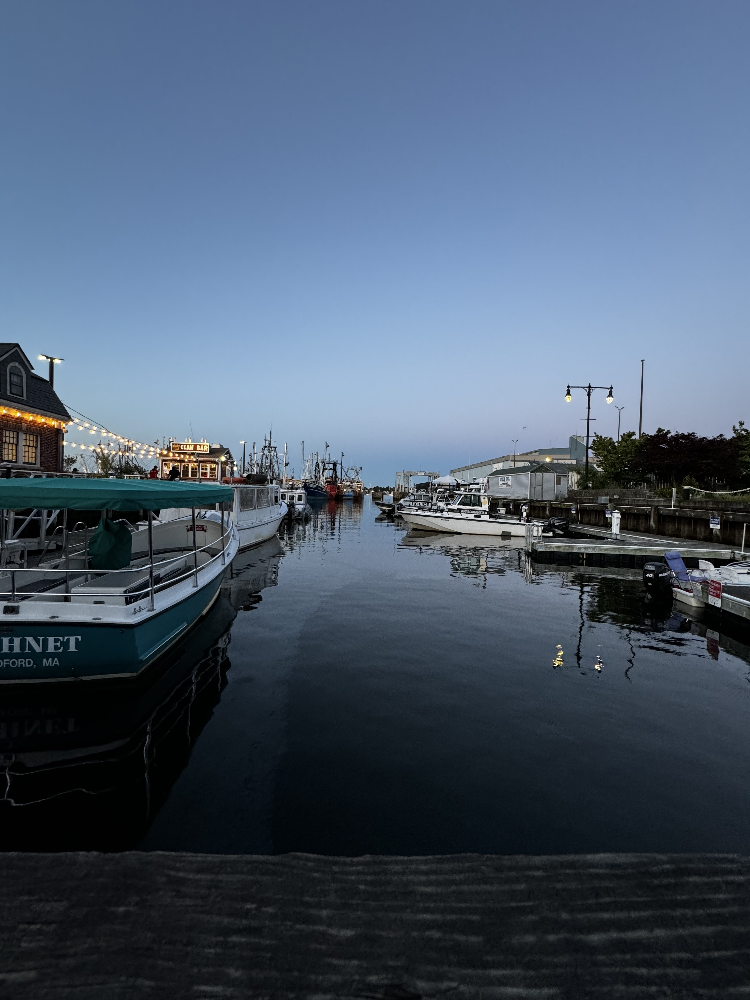

In [14]:
#Image Loading
img3 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg")
img3_rgb = img3[:,:,::-1]  #Converted from BGR to RGB
cv2_imshow(img3)
cv2.waitKey(0)
cv2.destroyAllWindows()

#Color Model

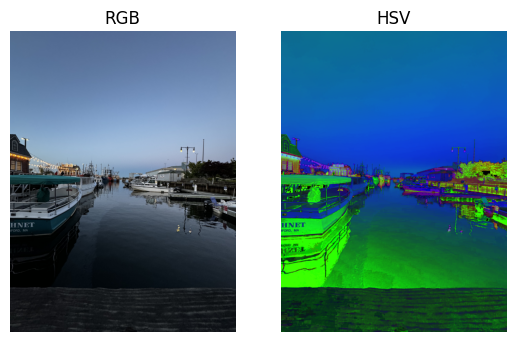

In [15]:
img_hsv = cv2.cvtColor(img3_rgb, cv2.COLOR_BGR2HSV)

plt.subplot(1,2,1)
plt.imshow(img3_rgb)
plt.title("RGB")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img_hsv)
plt.title("HSV")
plt.axis("off")

plt.show()

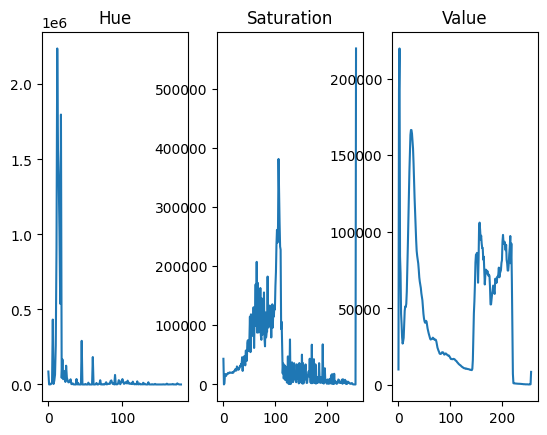

In [16]:
#Lets see the HUE using histogram

hue_hist = cv2.calcHist([img_hsv],[0],None,[180],[0,180])
saturate_hist = cv2.calcHist([img_hsv],[1],None,[256],[0,256])
value_hist = cv2.calcHist([img_hsv],[2],None,[256],[0,256])

plt.subplot(1,3,1)
plt.plot(hue_hist)
plt.title("Hue")

plt.subplot(1,3,2)
plt.plot(saturate_hist)
plt.title("Saturation")

plt.subplot(1,3,3)
plt.plot(value_hist)
plt.title("Value")

plt.show()

### When we use HSV

1) Usually when we want to see the image cool or warm we will see "HUE" and will not consider other paramters.

2) If we want to see Dull or Bright image we will see. "Saturation" and "Value"and will not consider other paramters.

In [18]:
def predict_cool_vs_warm(image_path):
    # Load the image and convert to HSV
    image = cv2.imread(image_path)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Get the hue channel (0 index)
    hue = image_hsv[:, :, 0]

    # Define warm (0-60) and cool (90-180) ranges
    warm_mask = (hue >= 0) & (hue <= 60)
    cool_mask = (hue >= 90) & (hue <= 180)

    # Calculate the percentage of warm and cool pixels
    warm_percentage = np.sum(warm_mask) / hue.size * 100
    cool_percentage = np.sum(cool_mask) / hue.size * 100

    # Decide which is dominant
    if warm_percentage > cool_percentage:
        prediction = "Warm"
    else:
        prediction = "Cool"

    print(f"Warm Pixels: {warm_percentage:.2f}%")
    print(f"Cool Pixels: {cool_percentage:.2f}%")

    return prediction

predict_cool_vs_warm('/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg')

Warm Pixels: 6.27%
Cool Pixels: 90.71%


'Cool'

In [19]:
def predict_dull_vs_bright(image_path):
    # Load the image and convert to HSV
    image = cv2.imread(image_path)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Get the saturation and value (brightness) channels
    saturation = image_hsv[:, :, 1]
    value = image_hsv[:, :, 2]

    # Define thresholds for dull (low saturation and brightness)
    dull_saturation_threshold = 80
    dull_value_threshold = 100

    # Calculate the percentage of dull pixels
    dull_mask = (saturation < dull_saturation_threshold) & (value < dull_value_threshold)
    dull_percentage = np.sum(dull_mask) / saturation.size * 100

    # Decide whether the image is dull or bright
    if dull_percentage > 50:  # If more than 50% of the image is dull
        prediction = "Dull"
    else:
        prediction = "Bright"

    print(f"Dull Pixels: {dull_percentage:.2f}%")

    return prediction

predict_dull_vs_bright('/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg')

Dull Pixels: 20.44%


'Bright'

##Color Thresholding
It allows you to filter specific colors from the image and create a mask out of it.

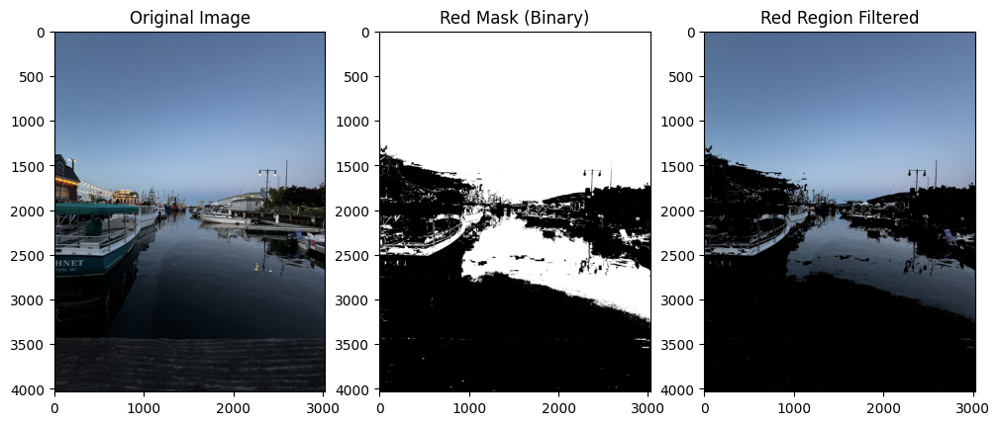

In [25]:
lower_blue = np.array([105, 0, 50])
upper_blue = np.array([120, 255, 255])

image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg')
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Create mask and apply it
mask = cv2.inRange(image_hsv, lower_blue, upper_blue)
# source image, second source image to perform the and operation with, mask that controls which pixels from the source images are used in the output.
res = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)

# Plot the mask to see the region detected and the result
plt.figure(figsize=(12, 6))

# Plot original image
plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.grid(False)  # Turn off grid

# Plot the mask (binary image where white represents detected blue regions)
plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Red Mask (Binary)')
plt.grid(False)  # Turn off grid

# Plot the blue-filtered result
plt.subplot(1, 3, 3)
plt.imshow(res)
plt.title('Red Region Filtered')
plt.grid(False)  # Turn off grid

plt.show()

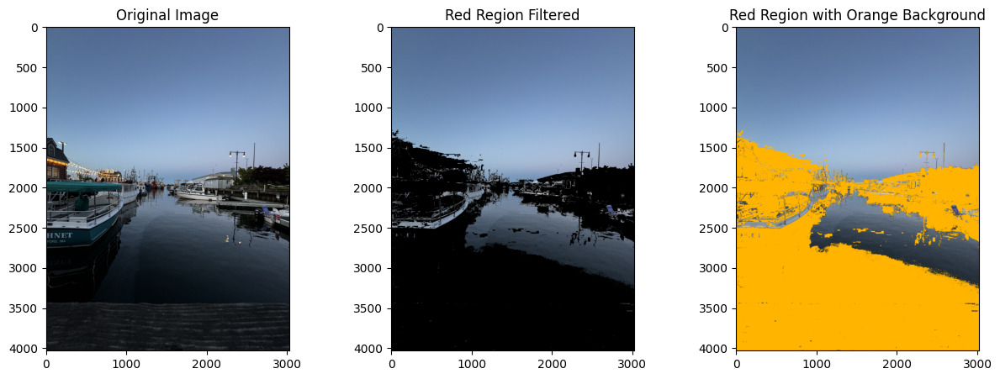

In [26]:
orange_image = np.zeros_like(image_rgb)
orange_image[:, :] = [255, 180, 0]

mask_inv = cv2.bitwise_not(mask)

orange_part = cv2.bitwise_and(orange_image, orange_image, mask=mask_inv)
#  keeps only the red regions in the areas where mask_inv is white

final_result = cv2.add(res, orange_part)

# Plot the original image, blue-filtered result, and final result
plt.figure(figsize=(15, 5))

# Plot original image
plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.grid(False)  # Turn off grid

# Plot the blue-filtered result
plt.subplot(1, 3, 2)
plt.imshow(res)
plt.title('Red Region Filtered')
plt.grid(False)  # Turn off grid

# Plot the final result (blue regions + orange background)
plt.subplot(1, 3, 3)
plt.imshow(final_result)
plt.title('Red Region with Orange Background')
plt.grid(False)  # Turn off grid

plt.show()

# What is Contour?

Contours are the boundaries of objects detected in an image. It helps us in finding the closed loops.

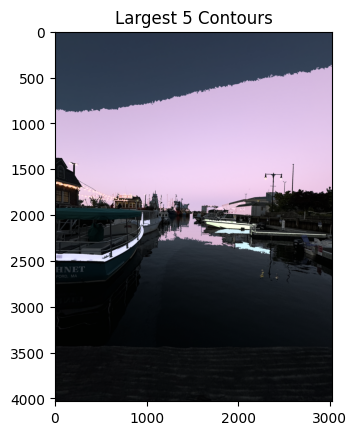

In [28]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


# Create a mask for the filled contours
image_filled_contours = np.zeros_like(image)

# Sort contours by area and keep the largest ones
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]  # Only take the top 5 largest contours

# Draw contours
for contour in contours:
    color = (np.random.randint(100, 255), np.random.randint(100, 255), np.random.randint(100, 255))  # Random RGB color
    cv2.drawContours(image_filled_contours, [contour], -1, color, thickness=cv2.FILLED)

# Combine filled contours with the original image
# You can choose to overlay the filled contours on the original image or keep them separate
# cv2.addWeighted(src1, alpha, src2, beta, gamma)
# alpha is weightage of first image and beta is weightage of second image
# gamma is brightness added to final result.
image_with_filled_contours = cv2.addWeighted(image, 0.5, image_filled_contours, 0.8, 1)

plt.imshow(image_with_filled_contours)
plt.title("Largest 5 Contours")
plt.grid(False)
plt.show()

# Find Shapes and Bounding Boxes

You can use contour approximation to detect specific shapes like triangles or rectangles. Contour approximation in OpenCV simplifies the shape of a contour by reducing the number of vertices while retaining the overall shape of the contour.

In [29]:
def get_shape(contour):
    # Approximate the contour
    # approx = cv2.approxPolyDP(curve, epsilon, closed)
    approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)

    # Determine the shape based on the number of vertices
    if len(approx) == 3:
        shape = "Triangle"
    elif len(approx) == 4:
        # Check for rectangle or square
        x, y, w, h = cv2.boundingRect(approx)
        aspect_ratio = float(w) / h
        shape = "Square" if aspect_ratio == 1 else "Rectangle"
    elif len(approx) == 5:
        shape = "Pentagon"
    elif len(approx) == 6:
        shape = "Hexagon"
    elif len(approx) > 6:
        shape = "Polygon"
    else:
        shape = "Unknown"

    return (approx, shape)

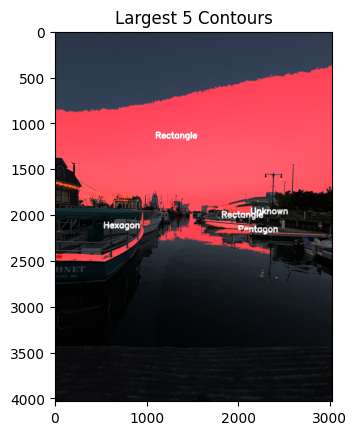

In [30]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


# Create a mask for the filled contours
image_filled_contours = np.zeros_like(image)

# Sort contours by area and keep the largest ones
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]  # Only take the top 5 largest contours

# Draw contours
for contour in contours:
    approx, shape = get_shape(contour)

    color = (np.random.randint(100, 255), np.random.randint(100, 255), np.random.randint(100, 255))  # Random RGB color
    color = (255, 0 , 0)

    cv2.drawContours(image_filled_contours, [contour], -1, color, thickness=cv2.FILLED)

    # Calculate position for the text below the shape
    cx, cy = int(np.mean(approx[:, 0, 0])), int(np.mean(approx[:, 0, 1]))  # Calculate centroid
    text_position = (cx - 150, cy - 150)  # Move text down by 20 pixels

    cv2.putText(image_filled_contours, shape, text_position, cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 255, 255), 15)

# Combine filled contours with the original image
# You can choose to overlay the filled contours on the original image or keep them separate
# cv2.addWeighted(src1, alpha, src2, beta, gamma)
# alpha is weightage of first image and beta is weightage of second image
# gamma is brightness added to final result.
image_with_filled_contours = cv2.addWeighted(image, 0.5, image_filled_contours, 0.8, 1)

plt.imshow(image_with_filled_contours)
plt.title("Largest 5 Contours")
plt.grid(False)
plt.show()

length of contour : 14785
length of contour : 2164
length of contour : 1501
length of contour : 1239
length of contour : 406


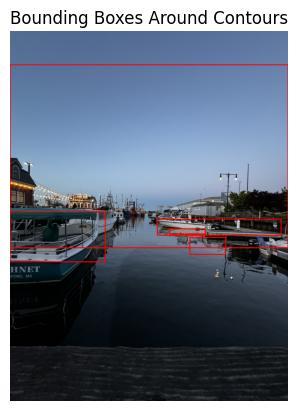

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision /Images/cloud.jpeg')

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to get a binary image
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Sort contours by area and keep the largest ones
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]  # Only take the top 5 largest contours

# Create a copy of the original image to draw on
image_with_bboxes = image.copy()

# Loop through each contour to draw bounding boxes
for contour in contours:
    print(f"length of contour : {len(contour)}")
    # Draw the bounding box around the contour
    x, y, w, h = cv2.boundingRect(contour)  # Get the bounding box coordinates
    cv2.rectangle(image_with_bboxes, (x, y), (x + w, y + h), (0, 0, 255), 10)  # Draw bounding box in yellow

# Display the result
plt.imshow(cv2.cvtColor(image_with_bboxes, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
plt.title("Bounding Boxes Around Contours")
plt.axis('off')  # Turn off axis
plt.show()
